## Triple pendulum using Lagrange's equations
---
In Cartesian coordinates of three masses:
\begin{align*}
  &x_1 = L_1 \sin(\theta_{1}) \\
  &x_2 = L_1 \sin(\theta_{1}) + L_2 \sin(\theta_{2}) \\
  &x_3 = L_1 \sin(\theta_{1}) + L_2 \sin(\theta_{2}) + L_3 \sin(\theta_{3})
\end{align*}

\begin{align*}
  &y_1 = -L_1 \cos(\theta_{1}) \\
  &y_2 = -L_1 \cos(\theta_{1}) - L_2 \cos(\theta_{2}) \\
  &y_3 = -L_1 \cos(\theta_{1}) - L_2 \cos(\theta_{2}) - L_3 \cos(\theta_{3})
\end{align*}

For a triple pendulum, the Lagrangian with generalized coordinate $\theta_{1}$, $\theta_{2}$, $\theta_{3}$ is

\begin{align*}
  T &= \frac{1}{2} m_1 (L_1 \dot\theta_1)^2 + \frac{1}{2} m_2 (L_2 \dot\theta_2)^2 + \frac{1}{2} m_3 (L_3 \dot\theta_3)^2 \\ 
  &= \frac{1}{2} m_1 (L_1 \dot{\theta}_1)^2 + \frac{1}{2} m_2 \left((L_1 \dot{\theta}_1)^2 + (L_2 \dot{\theta}_2)^2 + 2 L_1 L_2 \dot{\theta}_1 \dot{\theta}_2 \cos(\theta_1 - \theta_2)\right)\\
  & \quad + \frac{1}{2} m_3 \left((L_1 \dot{\theta}_1)^2 + (L_2 \dot{\theta}_2)^2 + (L_3 \dot{\theta}_3)^2 + 2 L_1 L_2 \dot{\theta}_1 \dot{\theta}_2 \cos(\theta_1 - \theta_2) + 2 L_1 L_3 \dot{\theta}_1 \dot{\theta}_3 \cos(\theta_1 - \theta_3) + 2 L_2 L_3 \dot{\theta}_2 \dot{\theta}_3 \cos(\theta_2 - \theta_3)\right)

\end{align*}

\begin{align*}
  U &= m_1 g y_1 + m_2 g y_2 + m_3 g y_3\\
  &=-m_1 g L_1 \cos(\theta_{1}) - m_2 g (L_1 \cos(\theta_{1}) + L_2 \cos(\theta_{2})) - m_3 g (L_1 \cos(\theta_{1}) + L_2 \cos(\theta_{2}) + L_3 \cos(\theta_{3}))\\
  &=-[(m_1 + m_2 + m_3) g L_1 \cos(\theta_{1})  + (m_2 + m_3) g L_2 \cos(\theta_{2}) + m_3 g L_3 \cos(\theta_{3})]
\end{align*}

Substitute $T$ and $U$ into the Lagrangian $\mathcal{L} = T-U $

\begin{align*} 
    \mathcal{L} &= T-U \\
    &= \frac{1}{2} m_1 (L_1 \dot{\theta}_1)^2 + \frac{1}{2} m_2 \left((L_1 \dot{\theta}_1)^2 + (L_2 \dot{\theta}_2)^2 + 2 L_1 L_2 \dot{\theta}_1 \dot{\theta}_2 \cos(\theta_1 - \theta_2)\right)\\
    & + \frac{1}{2} m_3 ((L_1 \dot{\theta}_1)^2 + (L_2 \dot{\theta}_2)^2 + (L_3 \dot{\theta}_3)^2 + 2 L_1 L_2 \dot{\theta}_1 \dot{\theta}_2 \cos(\theta_1 - \theta_2) \\
    & + L_1 L_3 \dot{\theta}_1 \dot{\theta}_3 \cos(\theta_1 - \theta_3) + 2 L_2 L_3 \dot{\theta}_2 \dot{\theta}_3 \cos(\theta_2 - \theta_3)) \\ 
    & + (m_1 + m_2 + m_3) g L_1 \cos(\theta_{1})  + (m_2 + m_3) g L_2 \cos(\theta_{2}) + m_3 g L_3 \cos(\theta_{3})
\end{align*}

Generalized momentums are

\begin{align*}
   &p_{\theta_{1}} = \frac{\partial\mathcal{L}}{\partial \dot\theta_{1}} = m_1 L_1^2 \dot{\theta}_1 + m_2 (L_1^2 \dot{\theta}_1 + L_1 L_2 \dot{\theta}_2 \cos(\theta_1 - \theta_2)) + m_3 (L_1^2 \dot{\theta}_1 + L_1 L_2 \dot{\theta}_2 \cos(\theta_1 - \theta_2) + L_1 L_3 \dot{\theta}_3 \cos(\theta_1 - \theta_3))
   \\
   &p_{\theta_{2}} = \frac{\partial\mathcal{L}}{\partial \dot\theta_{2}} = m_2 (L_2^2 \dot{\theta}_2 + L_1 L_2 \dot{\theta}_1 \cos(\theta_1 - \theta_2)) + m_3 (L_2^2 \dot{\theta}_2 + L_1 L_2 \dot{\theta}_1 \cos(\theta_1 - \theta_2) + L_2 L_3 \dot{\theta}_3 \cos(\theta_2 - \theta_3))
   \\
   &p_{\theta_{3}} = \frac{\partial\mathcal{L}}{\partial \dot\theta_{3}} = m_3 (L_3^2 \dot{\theta}_3 + L_1 L_3 \dot{\theta}_1 \cos(\theta_1 - \theta_3) + L_2 L_3 \dot{\theta}_2 \cos(\theta_2 - \theta_3))
   \\
\end{align*}

In [15]:
%matplotlib inline

In [16]:
import numpy as np
from scipy.integrate import odeint, solve_ivp
import matplotlib.pyplot as plt

## Pendulum Class

In [17]:
class TripleLagrangianPendulum():
    def __init__(self, L1, L2, L3, m1, m2, m3, g):
        self.L1 = L1
        self.L2 = L2
        self.L3 = L3
        self.m1 = m1
        self.m2 = m2
        self.m3 = m3
        self.g = g

    def dy_dt(self, t, y):
        theta1, theta1_dot, theta2, theta2_dot, theta3, theta3_dot = y
        m1 = self.m1
        m2 = self.m2
        m3 = self.m3
        L1 = self.L1
        L2 = self.L2
        L3 = self.L3
        g = self.g

        s12 = np.sin(theta1-theta2)
        s23 = np.sin(theta2-theta3)
        c12 = np.cos(theta1-theta2)
        c23 = np.cos(theta2-theta3)
        c13 = np.cos(theta1-theta3)

        z1=theta1_dot 
        z2=theta2_dot 
        z3=theta3_dot 
        
        theta1_ddot =  -((g*(m2*(m2+m3)+m1*(2*m2+m3)-m1*m3*np.cos(2*(theta2-theta3)))*np.sin(theta1)+g*m2*(m2+m3)*np.sin(theta1-2*theta2)+2*m2*s12*((m2+m3)*(L1*c12*z1**2+L2*z2**2)+L3*m3*c23*z3**2))/(L1*(m2*(2*m1+m2)+(m1+m2)*m3-m2*(m2+m3)*np.cos(2*(theta1-theta2))-m1*m3*np.cos(2*(theta2-theta3)))))
        theta2_ddot = (g*np.cos(theta1)*((2*m2*(m1+m2)+(m1+2*m2)*m3)*s12-m1*m3*np.sin(theta1+theta2-2*theta3))+L1*((2*m2*(m1+m2)+(m1+2*m2)*m3)*s12-m1*m3*np.sin(theta1+theta2-2*theta3))*z1**2+L2*(m2*(m2+m3)*np.sin(2*(theta1-theta2))-m1*m3*np.sin(2*(theta2-theta3)))*z2**2+2*L3*m3*(m2*c13*s12-self.m1*s23)*z3**2)/(L2*(m2*(2*m1+m2)+(m1+m2)*m3-m2*(m2+m3)*np.cos(2*(theta1-theta2))-m1*m3*np.cos(2*(theta2-theta3))))
        theta3_ddot = (2*m1*s23*((m2+m3)*(c12*(g*np.cos(theta1)+L1*z1**2)+L2*z2**2)+L3*m3*c23*(z3)**2))/(L3*(m2*(2*m1+m2)+(m1+m2)*m3-m2*(m2+m3)*np.cos(2*(theta1-theta2))-m1*m3*np.cos(2*(theta2-theta3))))


        return theta1_dot, theta1_ddot, theta2_dot, theta2_ddot, theta3_dot, theta3_ddot

    def solve_ode(self, t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0, theta3_0, theta3_dot_0,
                  abserr=1.0e-9, relerr=1.0e-9):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        """
        y = [theta1_0, theta1_dot_0, theta2_0, theta2_dot_0, theta3_0, theta3_dot_0] 
        # solution = odeint(self.dy_dt, y, t_pts, atol=abserr, rtol=relerr)
        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y, t_eval=t_pts, 
                             atol=abserr, rtol=relerr)
        theta1, theta1_dot, theta2, theta2_dot, theta3, theta3_dot = solution.y

        return theta1, theta1_dot, theta2, theta2_dot, theta3, theta3_dot   

In [18]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [19]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

In [20]:
# Common plotting time (generate the full time then use slices)
t_start = 0.
t_end = 400.
delta_t = 0.05

t_pts = np.arange(t_start, t_end + delta_t, delta_t)

# Instantiate a pendulum 
L1=2.
L2=1.
L3=1.
m1=1.
m2=1.
m3=1.
g=1.
tp1 = TripleLagrangianPendulum(L1=L1, L2=L2, L3=L3, m1=m1, m2=m2, m3=m3, g=g)

theta1_0 = np.pi/2
theta1_dot_0 = 0.
theta2_0 = np.pi
theta2_dot_0 = 0.
theta3_0 = np.pi
theta3_dot_0 = 0.
theta1, theta1_dot, theta2, theta2_dot, theta3, theta3_dot = \
    tp1.solve_ode(t_pts, theta1_0, theta1_dot_0, theta2_0, theta2_dot_0, theta3_0, theta3_dot_0)
theta1_s, theta1_dot_s, theta2_s, theta2_dot_s, theta3_s, theta3_dot_s = \
    tp1.solve_ode(t_pts, theta1_0+0.0000000001, theta1_dot_0, theta2_0, theta2_dot_0, theta3_0, theta3_dot_0)

# Plot Double Pendulum $\phi$ vs $t$

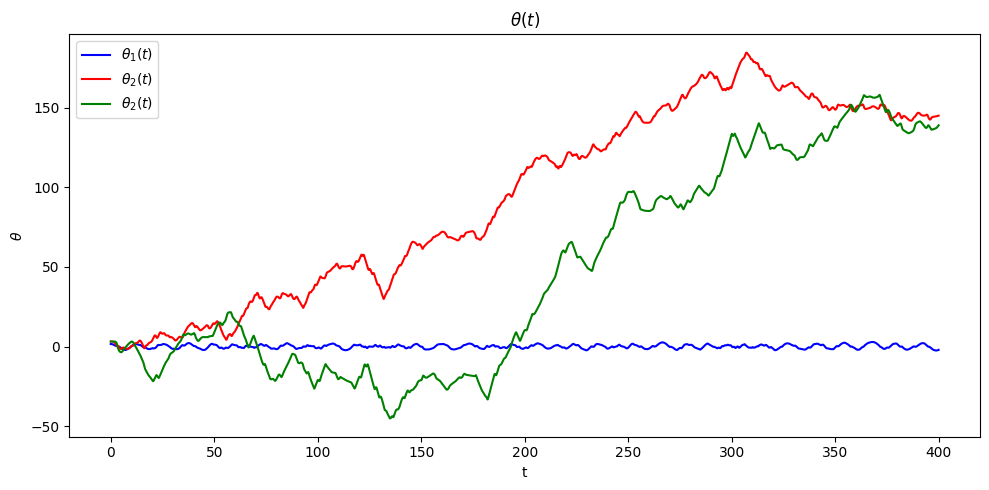

In [21]:
# start the plot!
fig = plt.figure(figsize=(10,5))
    
# first plot: phi plot 
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
ax_a.plot(t_pts[start : stop], theta1[start : stop], color='blue',label=r'$\theta_1(t)$')    
ax_a.plot(t_pts[start : stop], theta2[start : stop], color='red',label=r'$\theta_2(t)$')   
ax_a.plot(t_pts[start : stop], theta3[start : stop], color='green',label=r'$\theta_2(t)$')   
ax_a.set_title(r'$\theta(t)$')
ax_a.set_xlabel('t')
ax_a.set_ylabel(r'$\theta$')
ax_a.legend()

fig.tight_layout()
# fig.savefig('simple_pendulum_Lagrange.png', bbox_inches='tight')  

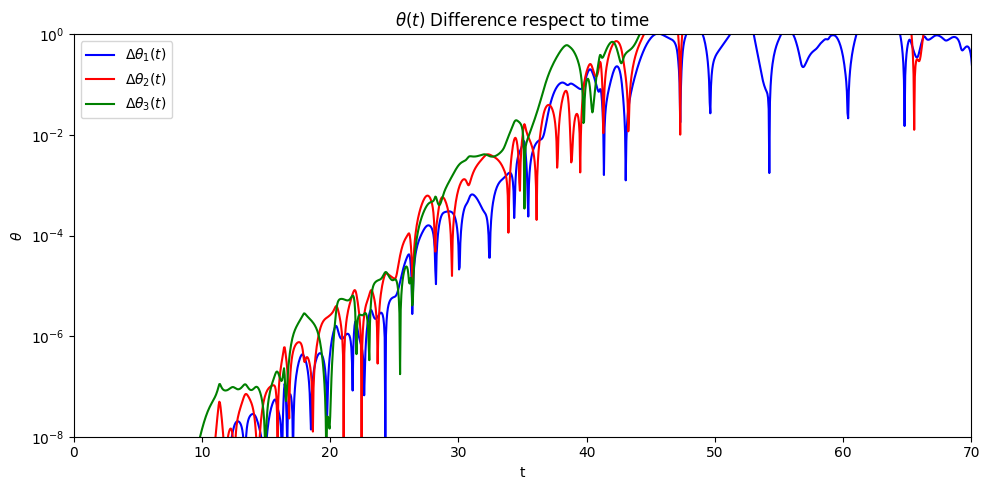

In [22]:
# start the plot!
fig = plt.figure(figsize=(10,5))
    
# first plot: phi plot 
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], np.abs(theta1_s[start : stop]-theta1[start : stop]), color='blue',label=r'$\Delta\theta_1(t)$',semilogy=True,ax=ax_a)    
plot_y_vs_x(t_pts[start : stop], np.abs(theta2_s[start : stop]-theta2[start : stop]), color='red',label=r'$\Delta\theta_2(t)$',semilogy=True,ax=ax_a) 
plot_y_vs_x(t_pts[start : stop], np.abs(theta3_s[start : stop]-theta3[start : stop]), color='green',label=r'$\Delta\theta_3(t)$',semilogy=True,ax=ax_a)    
ax_a.set_title(r'$\theta(t)$' + " Difference respect to time")
ax_a.set_xlabel('t')
ax_a.set_xlim(0,70)
ax_a.set_ylim(1.e-8,1)
ax_a.set_ylabel(r'$\theta$')
ax_a.legend()

fig.tight_layout()
# fig.savefig('simple_pendulum_Lagrange.png', bbox_inches='tight')  

# Animating Double Pendulum

In [23]:
from matplotlib import animation, rc
from IPython.display import HTML

In [24]:
def xy_coords(x0, y0, theta, L):
    x = x0 + L * np.sin(theta)
    y = y0 - L * np.cos(theta)
    return x, y

In [25]:
%%capture
x_min = -5.
x_max = -x_min
y_min = -5.
y_max = -y_min

fig_anim = plt.figure(figsize=(5, 5), num='Double Pendulum')
ax_anim = fig_anim.add_subplot(1, 1, 1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)

x0, y0 = 0., 0.
pt0_anim, = ax_anim.plot(x0, y0, 'o', markersize=6, color='black')

x1, y1 = xy_coords(x0, y0, theta1[0], tp1.L1)
pt1_anim, = ax_anim.plot(x1, y1, 'o', markersize=12, color='blue')
ln1_anim, = ax_anim.plot([x0, x1], [y0, y1], color='blue', lw=3)

x2, y2 = xy_coords(x1, y1, theta2[0], tp1.L2)
pt2_anim, = ax_anim.plot(x2, y2, 'o', markersize=12, color='blue')
ln2_anim, = ax_anim.plot([x1, x2], [y1, y2], color='blue', lw=3)

x3, y3 = xy_coords(x2, y2, theta3[0], tp1.L3)
pt3_anim, = ax_anim.plot(x3, y3, 'o', markersize=12, color='blue')
ln3_anim, = ax_anim.plot([x2, x3], [y2, y3], color='blue', lw=3)

x1_s, y1_s = xy_coords(x0, y0, theta1_s[0], tp1.L1)
pt1_anim_s, = ax_anim.plot(x1_s, y1_s, 'o', markersize=12, color='red')
ln1_anim_s, = ax_anim.plot([x0, x1_s], [y0, y1_s], color='red', lw=3)

x2_s, y2_s = xy_coords(x1_s, y1_s, theta2_s[0], tp1.L2)
pt2_anim_s, = ax_anim.plot(x2_s, y2_s, 'o', markersize=12, color='red')
ln2_anim_s, = ax_anim.plot([x1_s, x2_s], [y1_s, y2_s], color='red', lw=3)

x3_s, y3_s = xy_coords(x2_s, y2_s, theta3_s[0], tp1.L3)
pt3_anim_s, = ax_anim.plot(x3_s, y3_s, 'o', markersize=12, color='red')
ln3_anim_s, = ax_anim.plot([x2_s, x3_s], [y2_s, y3_s], color='red', lw=3)

ax_anim.set_aspect(1)
ax_anim.axis('off')
fig_anim.tight_layout()

In [26]:
def animate_pendulum(i):
    i_skip = 2 * i

    x0, y0 = 0., 0.
    pt0_anim.set_data(x0, y0)

    x1, y1 = xy_coords(x0, y0, theta1[i_skip], tp1.L1)
    pt1_anim.set_data(x1, y1)
    ln1_anim.set_data([x0, x1], [y0, y1])

    x2, y2 = xy_coords(x1, y1, theta2[i_skip], tp1.L2)
    pt2_anim.set_data(x2, y2)
    ln2_anim.set_data([x1, x2], [y1, y2])

    x3, y3 = xy_coords(x2, y2, theta3[i_skip], tp1.L3)
    pt3_anim.set_data(x3, y3)
    ln3_anim.set_data([x2, x3], [y2, y3])

    x1_s, y1_s = xy_coords(x0, y0, theta1_s[i_skip], tp1.L1)
    pt1_anim_s.set_data(x1_s, y1_s)
    ln1_anim_s.set_data([x0, x1_s], [y0, y1_s])

    x2_s, y2_s = xy_coords(x1_s, y1_s, theta2_s[i_skip], tp1.L2)
    pt2_anim_s.set_data(x2_s, y2_s)
    ln2_anim_s.set_data([x1_s, x2_s], [y1_s, y2_s])

    x3_s, y3_s = xy_coords(x2_s, y2_s, theta3_s[i_skip], tp1.L3)
    pt3_anim_s.set_data(x3_s, y3_s)
    ln3_anim_s.set_data([x2_s, x3_s], [y2_s, y3_s])

    return (pt0_anim, pt1_anim, ln1_anim, pt2_anim, ln2_anim, pt3_anim, ln3_anim,
            pt1_anim_s, ln1_anim_s, pt2_anim_s, ln2_anim_s, pt3_anim_s, ln3_anim_s)

frame_interval = 20  # time between frames
frame_number = 1001   # number of frames to include (index of t_pts)
anim = animation.FuncAnimation(fig_anim, 
                               animate_pendulum, 
                               init_func=None,
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True,
                               repeat=False)

HTML(anim.to_jshtml())